In [1]:
import cv2 as cv
import matplotlib.pyplot as plt

In [3]:
net = cv.dnn.readNetFromTensorflow("Desktop/Fall/human-pose-estimation-opencv-master/graph_opt.pb")

In [5]:
inWidth = 368
inHeight= 368
thr= 0.2


In [7]:
BODY_PARTS = { "Nose": 0, "Neck": 1, "RShoulder": 2, "RElbow": 3, "RWrist": 4,
               "LShoulder": 5, "LElbow": 6, "LWrist": 7, "RHip": 8, "RKnee": 9,
               "RAnkle": 10, "LHip": 11, "LKnee": 12, "LAnkle": 13, "REye": 14,
               "LEye": 15, "REar": 16, "LEar": 17, "Background": 18 }

POSE_PAIRS = [ ["Neck", "RShoulder"], ["Neck", "LShoulder"], ["RShoulder", "RElbow"],
               ["RElbow", "RWrist"], ["LShoulder", "LElbow"], ["LElbow", "LWrist"],
               ["Neck", "RHip"], ["RHip", "RKnee"], ["RKnee", "RAnkle"], ["Neck", "LHip"],
               ["LHip", "LKnee"], ["LKnee", "LAnkle"], ["Neck", "Nose"], ["Nose", "REye"],
               ["REye", "REar"], ["Nose", "LEye"], ["LEye", "LEar"] ]

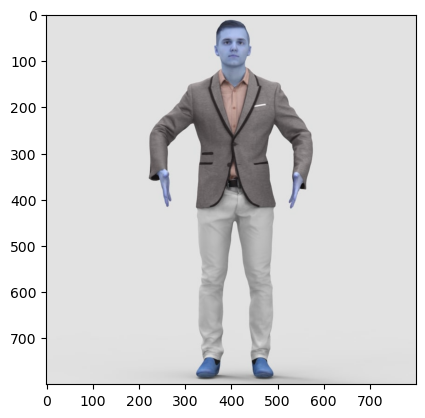

In [9]:
img = cv.imread("Desktop/Fall/human-pose-estimation-opencv-master/image.jpg")
plt.imshow(img)

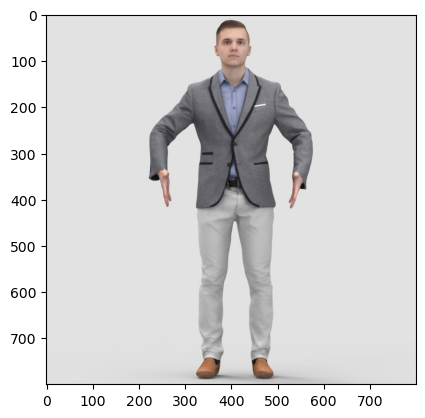

In [11]:
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

In [13]:
def pose_estimation(frame, thr=0.1):
    frameWidth = frame.shape[1]
    frameHeight = frame.shape[0]

    net.setInput(cv.dnn.blobFromImage(frame, 1.0, (inWidth, inHeight), (127.5, 127.5, 127.5), swapRB=True, crop=False))
    out = net.forward()
    out = out[:, :19, :, :]  # MobileNet output [1, 57, -1, -1], we only need the first 19 elements

    assert len(BODY_PARTS) == out.shape[1]

    points = []
    for i in range(len(BODY_PARTS)):
        heatMap = out[0, i, :, :]

        _, conf, _, point = cv.minMaxLoc(heatMap)
        x = (frameWidth * point[0]) / out.shape[3]
        y = (frameHeight * point[1]) / out.shape[2]

        # Append (x, y) if confidence is higher than the threshold, else append (None, None)
        if conf > thr:
            points.append((float(x), float(y)))
        else:
            points.append((None, None))

    return points




In [15]:
def draw_pose(frame, points):
    # Draw the pose on the image
    for pair in POSE_PAIRS:
        partFrom = pair[0]
        partTo = pair[1]

        idFrom = BODY_PARTS[partFrom]
        idTo = BODY_PARTS[partTo]

        # Check if both points are not None
        if points[idFrom] is not None and points[idTo] is not None:
            # Convert coordinates to integers
            pt1 = (int(points[idFrom][0]), int(points[idFrom][1]))
            pt2 = (int(points[idTo][0]), int(points[idTo][1]))

            # Draw lines and ellipses on the frame
            cv.line(frame, pt1, pt2, (0, 255, 0), 3)
            cv.ellipse(frame, pt1, (3, 3), 0, 0, 360, (0, 0, 255), cv.FILLED)
            cv.ellipse(frame, pt2, (3, 3), 0, 0, 360, (0, 0, 255), cv.FILLED)

    return frame



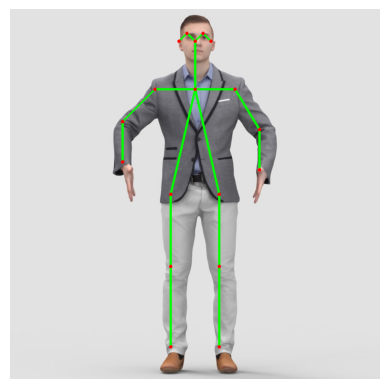

In [17]:
# Read an image
img = cv.imread("Desktop/Fall/human-pose-estimation-opencv-master/image.jpg")

# Get pose coordinates
points = pose_estimation(img, thr=0.2)

# Draw the pose on the image
estimated_image = draw_pose(img, points)

# Convert color and display the image
plt.imshow(cv.cvtColor(estimated_image, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()



In [19]:
import os
import pandas as pd

def process_labeled_images(input_folder, output_excel, thr=0.2):
    data = []

    # Iterate over the classified subfolders
    for label in os.listdir(input_folder):
        label_path = os.path.join(input_folder, label)
        
        if not os.path.isdir(label_path):
            continue
        
        # Iterate over all images within each label folder
        for img_name in os.listdir(label_path):
            img_path = os.path.join(label_path, img_name)
            img = cv.imread(img_path)

            if img is None:
                print(f"Could not read {img_name} in {label}. Skipping...")
                continue

            # Get pose estimation for the current image
            points = pose_estimation(img, thr)

            # Prepare data for saving
            img_data = {'Image': img_name, 'Label': label}
            for part, index in BODY_PARTS.items():
                x, y = points[index]
                img_data[f"{part}_x"] = x
                img_data[f"{part}_y"] = y

            data.append(img_data)

    # Convert the data to a DataFrame
    df = pd.DataFrame(data)

    # Save the DataFrame to an Excel file
    df.to_excel(output_excel, index=False)
    print(f"Coordinates saved to {output_excel}")

# Set the input folder and output Excel file path
input_folder = "Desktop/Fall Detection"
output_excel = "labeled_pose_coordinates.xlsx"

# Process the labeled images and save to Excel
process_labeled_images(input_folder, output_excel, thr=0.2)




Coordinates saved to labeled_pose_coordinates.xlsx


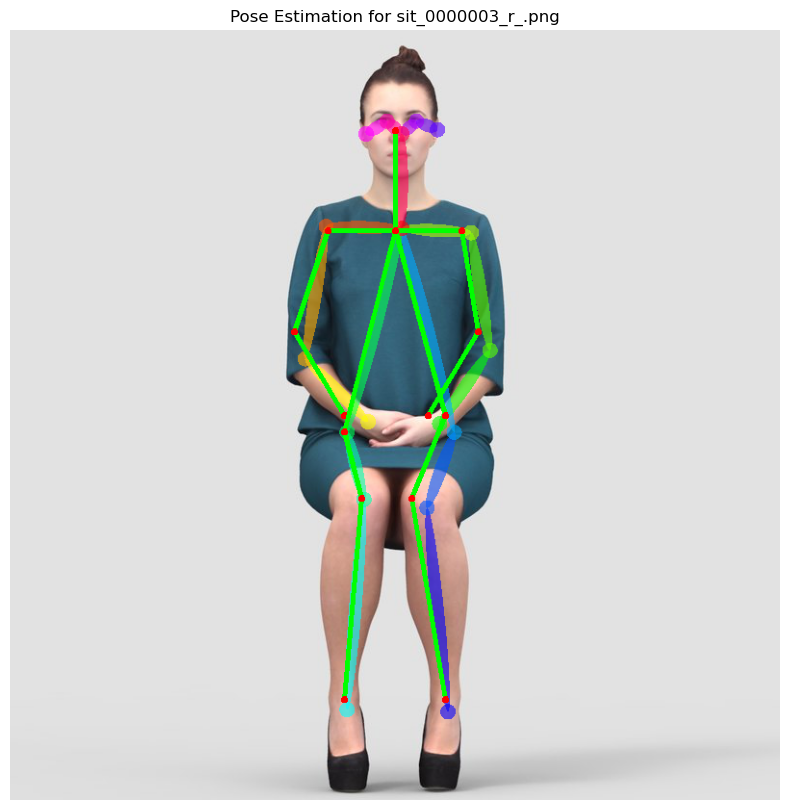

In [21]:
import cv2 as cv
import matplotlib.pyplot as plt

# Set the path to the specific image
image_path = "Desktop/Fall Detection/Sitting/sit_0000003_r_.png"

# Read the image
img = cv.imread(image_path)

if img is not None:
    # Get pose estimation for the image
    points = pose_estimation(img, thr=0.2)

    # Draw the pose on the image
    for pair in POSE_PAIRS:
        partFrom = pair[0]
        partTo = pair[1]

        idFrom = BODY_PARTS[partFrom]
        idTo = BODY_PARTS[partTo]

        # Ensure both points are valid and have no None values
        if (points[idFrom] is not None and points[idTo] is not None and
            points[idFrom][0] is not None and points[idFrom][1] is not None and
            points[idTo][0] is not None and points[idTo][1] is not None):

            pt1 = (int(points[idFrom][0]), int(points[idFrom][1]))
            pt2 = (int(points[idTo][0]), int(points[idTo][1]))

            # Draw line between the two body parts
            cv.line(img, pt1, pt2, (0, 255, 0), 3)
            # Draw circles at the body part points
            cv.ellipse(img, pt1, (3, 3), 0, 0, 360, (0, 0, 255), cv.FILLED)
            cv.ellipse(img, pt2, (3, 3), 0, 0, 360, (0, 0, 255), cv.FILLED)

    # Convert BGR to RGB for visualization
    img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

    # Display the image with pose estimation
    plt.figure(figsize=(10, 10))
    plt.imshow(img_rgb)
    plt.title("Pose Estimation for sit_0000003_r_.png")
    plt.axis('off')
    plt.show()
else:
    print(f"Could not read the image at {image_path}.")


# **Random Forest**


Training data size: 432
Validation data size: 93
Testing data size: 93

Validation Accuracy: 77.42%
Testing Accuracy: 74.19%

Classification Report (Testing):
              precision    recall  f1-score   support

  Lying Down       0.95      0.97      0.96        39
     Sitting       0.71      0.53      0.61        32
    Standing       0.48      0.64      0.55        22

    accuracy                           0.74        93
   macro avg       0.71      0.71      0.71        93
weighted avg       0.76      0.74      0.74        93



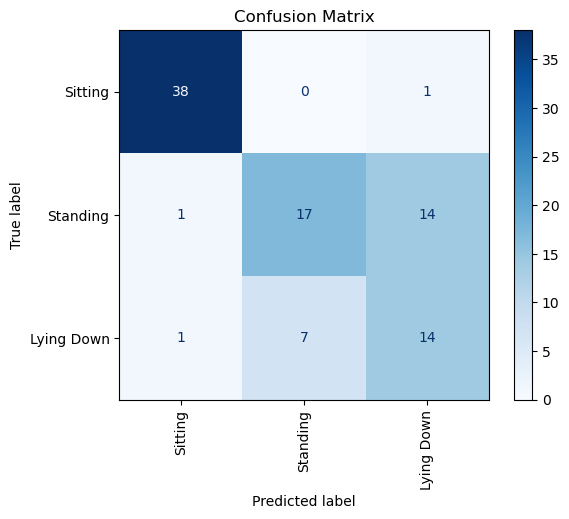

In [31]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay

# Load the dataset (Assume keypoints have been saved to an Excel file)
data_path = "labeled_pose_coordinates.xlsx"
df = pd.read_excel(data_path)

# Prepare the feature matrix (X) and target vector (y)
X = df.drop(columns=['Image', 'Label'])  # Drop non-feature columns
y = df['Label']  # Target variable

# Split the data: 70% training, 15% validation, 15% testing
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.30, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.50, random_state=42)

# Check the sizes of the datasets
print(f"Training data size: {X_train.shape[0]}")
print(f"Validation data size: {X_val.shape[0]}")
print(f"Testing data size: {X_test.shape[0]}")

# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the classifier on the training data
rf_classifier.fit(X_train, y_train)

# Make predictions on the validation and testing sets
y_val_pred = rf_classifier.predict(X_val)
y_test_pred = rf_classifier.predict(X_test)

# Calculate accuracy on validation and testing sets
val_accuracy = accuracy_score(y_val, y_val_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

# Print classification reports
print(f"\nValidation Accuracy: {val_accuracy * 100:.2f}%")
print(f"Testing Accuracy: {test_accuracy * 100:.2f}%")
print("\nClassification Report (Testing):")
print(classification_report(y_test, y_test_pred))

cm = confusion_matrix(y_test, y_test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=y_test.unique())
    
# Plot the confusion matrix
disp.plot(cmap='Blues', xticks_rotation='vertical')
plt.title("Confusion Matrix")
plt.show()

# **Pre Hyperparameter Tuning**


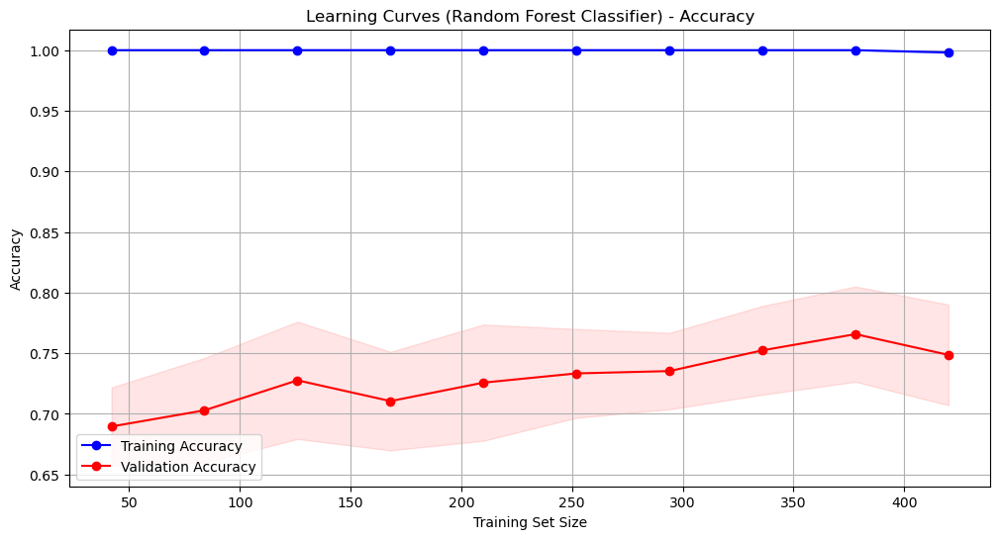

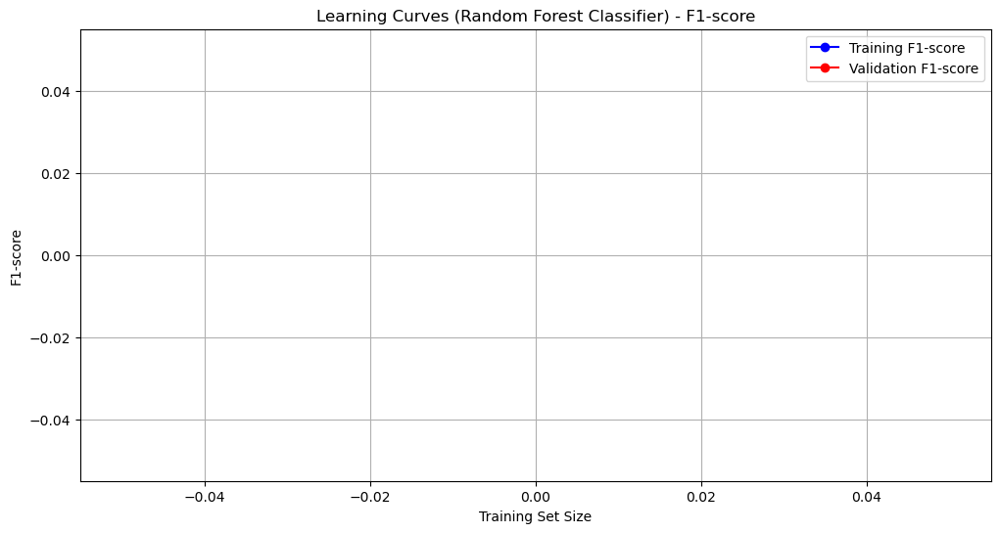

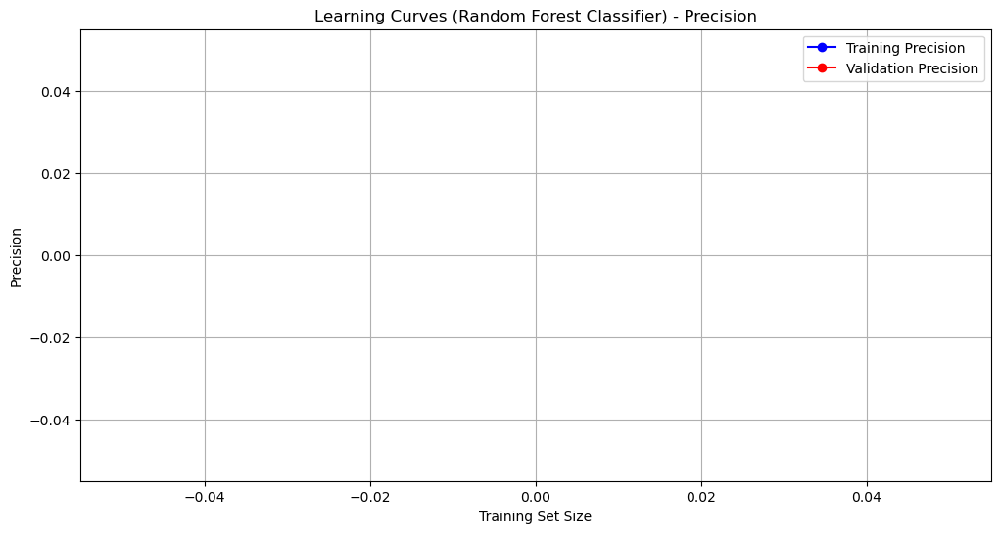

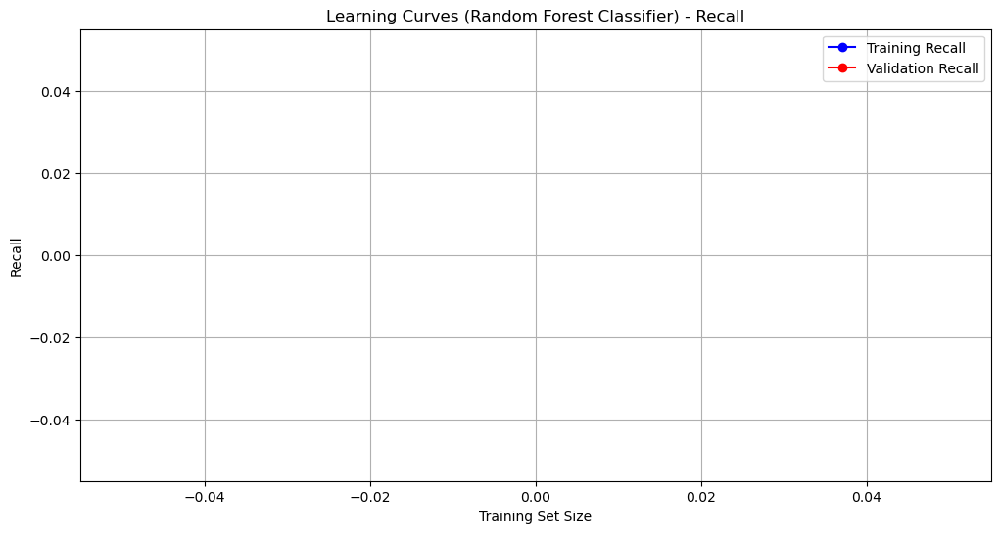

In [37]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import learning_curve
from sklearn.metrics import make_scorer, f1_score, precision_score, recall_score, accuracy_score
from sklearn.utils.class_weight import compute_sample_weight

def plot_learning_curves(model, X, y, train_sizes=np.linspace(0.1, 1.0, 10), cv=5):
    # Define different scoring metrics
    scoring_metrics = {
        'Accuracy': 'accuracy',
        'F1-score': make_scorer(f1_score, average='macro'),
        'Precision': make_scorer(precision_score, average='macro'),
        'Recall': make_scorer(recall_score, average='macro')
    }

    # Plot learning curves for each metric
    for metric_name, metric in scoring_metrics.items():
        train_sizes, train_scores, val_scores = learning_curve(
            model, X, y, train_sizes=train_sizes, cv=cv, scoring=metric, n_jobs=-1
        )

        # Calculate mean and standard deviation for training and validation scores
        train_scores_mean = np.mean(train_scores, axis=1)
        train_scores_std = np.std(train_scores, axis=1)
        val_scores_mean = np.mean(val_scores, axis=1)
        val_scores_std = np.std(val_scores, axis=1)

        # Plotting the learning curves
        plt.figure(figsize=(12, 6))
        plt.plot(train_sizes, train_scores_mean, 'o-', color='b', label=f'Training {metric_name}')
        plt.plot(train_sizes, val_scores_mean, 'o-', color='r', label=f'Validation {metric_name}')
        plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color='b')
        plt.fill_between(train_sizes, val_scores_mean - val_scores_std, val_scores_mean + val_scores_std, alpha=0.1, color='r')

        plt.xlabel('Training Set Size')
        plt.ylabel(metric_name)
        plt.title(f'Learning Curves (Random Forest Classifier) - {metric_name}')
        plt.legend(loc='best')
        plt.grid(True)
        plt.show()

# Prepare the complete dataset (combining training and validation sets)
X_combined = pd.concat([X_train, X_val])
y_combined = pd.concat([y_train, y_val])

# Initialize the Random Forest Classifier with class weights
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')

# Plot the learning curves for different metrics
plot_learning_curves(rf_classifier, X_combined, y_combined, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)




Predicted Pose: Sitting


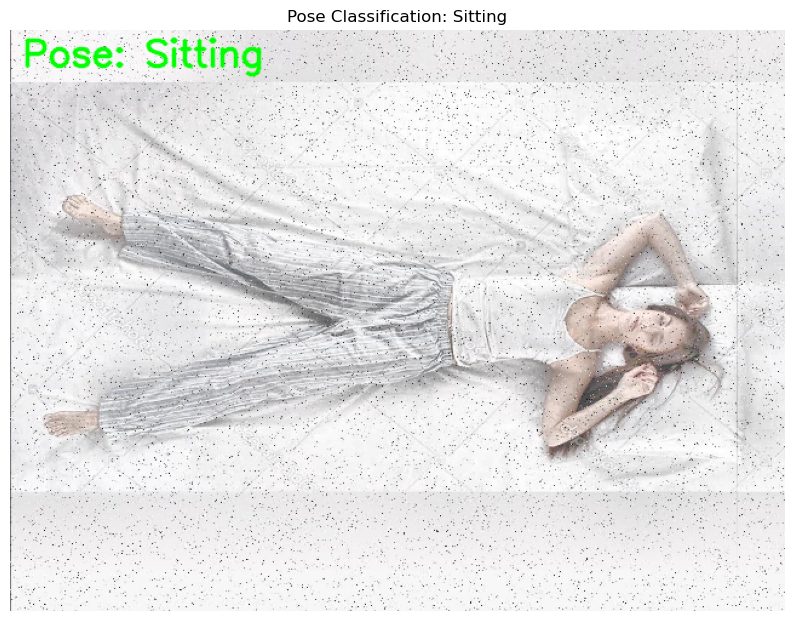

In [39]:

# Load and train the Random Forest model
data_path = "labeled_pose_coordinates.xlsx"
df = pd.read_excel(data_path)

# Prepare the feature matrix (X) and target vector (y)
X = df.drop(columns=['Image', 'Label'])
y = df['Label']

# Split the data: 80% training, 20% testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)

def pose_estimation_with_skeleton(frame, thr=0.2):
    keypoints = pose_estimation(frame, thr=thr)

    for pair in POSE_PAIRS:
        partFrom = pair[0]
        partTo = pair[1]

        idFrom = BODY_PARTS[partFrom]
        idTo = BODY_PARTS[partTo]

        if (keypoints[idFrom] is not None and keypoints[idTo] is not None and
            keypoints[idFrom][0] is not None and keypoints[idFrom][1] is not None and
            keypoints[idTo][0] is not None and keypoints[idTo][1] is not None):

            pt1 = (int(keypoints[idFrom][0]), int(keypoints[idFrom][1]))
            pt2 = (int(keypoints[idTo][0]), int(keypoints[idTo][1]))

            cv.line(frame, pt1, pt2, (0, 255, 0), 3)
            cv.ellipse(frame, pt1, (3, 3), 0, 0, 360, (0, 0, 255), cv.FILLED)
            cv.ellipse(frame, pt2, (3, 3), 0, 0, 360, (0, 0, 255), cv.FILLED)

    return keypoints

def classify_image(image_path):
    img = cv.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return

    img = cv.resize(img, (640, 480))
    keypoints = pose_estimation_with_skeleton(img, thr=0.2)

    feature_vector = []
    for point in keypoints:
        if point is not None:
            feature_vector.extend([point[0], point[1]])
        else:
            feature_vector.extend([0, 0])

    if len(feature_vector) == len(BODY_PARTS) * 2:
        # Convert feature_vector to a DataFrame with the same column names used in training
        feature_vector_df = pd.DataFrame([feature_vector], columns=X_train.columns)

        # Predict using the Random Forest model
        prediction = rf_classifier.predict(feature_vector_df)[0]
        print(f"Predicted Pose: {prediction}")

        cv.putText(img, f"Pose: {prediction}", (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv.LINE_AA)

        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.title(f"Pose Classification: {prediction}")
        plt.axis('off')
        plt.show()
    else:
        print("Error: Incomplete keypoint extraction. Unable to classify pose.")

# Example usage
image_path = "Desktop/Fall Detection/Lying Down/57_jpg.rf.852af7a7db5efce5a701bf2e7d2f75d4.jpg"
classify_image(image_path)



Predicted Pose: Standing


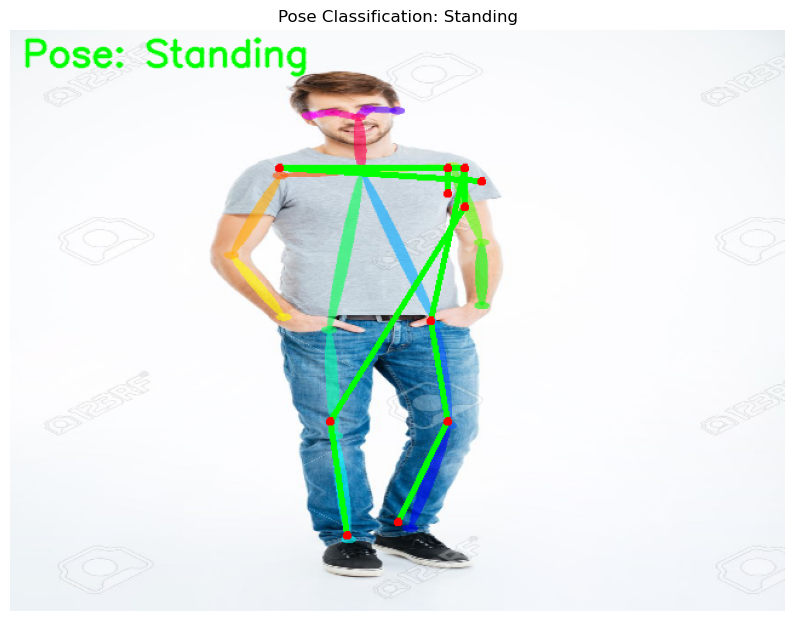

In [41]:

# Load and train the Random Forest model
data_path = "labeled_pose_coordinates.xlsx"
df = pd.read_excel(data_path)

# Prepare the feature matrix (X) and target vector (y)
X = df.drop(columns=['Image', 'Label'])
y = df['Label']

# Split the data: 80% training, 20% testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)

def pose_estimation_with_skeleton(frame, thr=0.2):
    keypoints = pose_estimation(frame, thr=thr)

    for pair in POSE_PAIRS:
        partFrom = pair[0]
        partTo = pair[1]

        idFrom = BODY_PARTS[partFrom]
        idTo = BODY_PARTS[partTo]

        if (keypoints[idFrom] is not None and keypoints[idTo] is not None and
            keypoints[idFrom][0] is not None and keypoints[idFrom][1] is not None and
            keypoints[idTo][0] is not None and keypoints[idTo][1] is not None):

            pt1 = (int(keypoints[idFrom][0]), int(keypoints[idFrom][1]))
            pt2 = (int(keypoints[idTo][0]), int(keypoints[idTo][1]))

            cv.line(frame, pt1, pt2, (0, 255, 0), 3)
            cv.ellipse(frame, pt1, (3, 3), 0, 0, 360, (0, 0, 255), cv.FILLED)
            cv.ellipse(frame, pt2, (3, 3), 0, 0, 360, (0, 0, 255), cv.FILLED)

    return keypoints

def classify_image(image_path):
    img = cv.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return

    img = cv.resize(img, (640, 480))
    keypoints = pose_estimation_with_skeleton(img, thr=0.2)

    feature_vector = []
    for point in keypoints:
        if point is not None:
            feature_vector.extend([point[0], point[1]])
        else:
            feature_vector.extend([0, 0])

    if len(feature_vector) == len(BODY_PARTS) * 2:
        # Convert feature_vector to a DataFrame with the same column names used in training
        feature_vector_df = pd.DataFrame([feature_vector], columns=X_train.columns)

        # Predict using the Random Forest model
        prediction = rf_classifier.predict(feature_vector_df)[0]
        print(f"Predicted Pose: {prediction}")

        cv.putText(img, f"Pose: {prediction}", (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv.LINE_AA)

        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.title(f"Pose Classification: {prediction}")
        plt.axis('off')
        plt.show()
    else:
        print("Error: Incomplete keypoint extraction. Unable to classify pose.")

# Example usage
image_path ="Desktop/Fall Detection/Standing/stand_0000009_r_.png"
classify_image(image_path)



Predicted Pose: Sitting


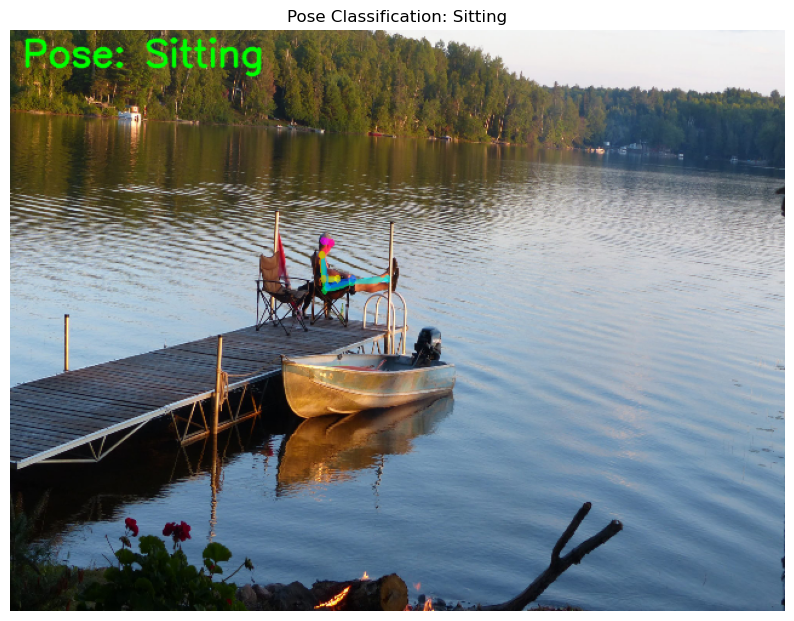

In [43]:

# Load and train the Random Forest model
data_path = "labeled_pose_coordinates.xlsx"
df = pd.read_excel(data_path)

# Prepare the feature matrix (X) and target vector (y)
X = df.drop(columns=['Image', 'Label'])
y = df['Label']

# Split the data: 80% training, 20% testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)

def pose_estimation_with_skeleton(frame, thr=0.2):
    keypoints = pose_estimation(frame, thr=thr)

    for pair in POSE_PAIRS:
        partFrom = pair[0]
        partTo = pair[1]

        idFrom = BODY_PARTS[partFrom]
        idTo = BODY_PARTS[partTo]

        if (keypoints[idFrom] is not None and keypoints[idTo] is not None and
            keypoints[idFrom][0] is not None and keypoints[idFrom][1] is not None and
            keypoints[idTo][0] is not None and keypoints[idTo][1] is not None):

            pt1 = (int(keypoints[idFrom][0]), int(keypoints[idFrom][1]))
            pt2 = (int(keypoints[idTo][0]), int(keypoints[idTo][1]))

            cv.line(frame, pt1, pt2, (0, 255, 0), 3)
            cv.ellipse(frame, pt1, (3, 3), 0, 0, 360, (0, 0, 255), cv.FILLED)
            cv.ellipse(frame, pt2, (3, 3), 0, 0, 360, (0, 0, 255), cv.FILLED)

    return keypoints

def classify_image(image_path):
    img = cv.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return

    img = cv.resize(img, (640, 480))
    keypoints = pose_estimation_with_skeleton(img, thr=0.2)

    feature_vector = []
    for point in keypoints:
        if point is not None:
            feature_vector.extend([point[0], point[1]])
        else:
            feature_vector.extend([0, 0])

    if len(feature_vector) == len(BODY_PARTS) * 2:
        # Convert feature_vector to a DataFrame with the same column names used in training
        feature_vector_df = pd.DataFrame([feature_vector], columns=X_train.columns)

        # Predict using the Random Forest model
        prediction = rf_classifier.predict(feature_vector_df)[0]
        print(f"Predicted Pose: {prediction}")

        cv.putText(img, f"Pose: {prediction}", (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv.LINE_AA)

        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.title(f"Pose Classification: {prediction}")
        plt.axis('off')
        plt.show()
    else:
        print("Error: Incomplete keypoint extraction. Unable to classify pose.")

# Example usage
image_path = "Desktop/Fall Detection/Sitting/sit_0000095_r_.png"
classify_image(image_path)



# **Post Hyperparameter Tuning**

Starting Grid Search for Hyperparameter Tuning...
Fitting Grid Search...
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Grid Search completed!

Best Hyperparameters (Grid Search): {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 50}
Best Training Accuracy: 0.79

Classification Report:
              precision    recall  f1-score   support

  Lying Down       0.88      0.91      0.89        46
    Standing       0.56      0.53      0.54        38
     Sitting       0.57      0.57      0.57        40

    accuracy                           0.69       124
   macro avg       0.67      0.67      0.67       124
weighted avg       0.68      0.69      0.68       124



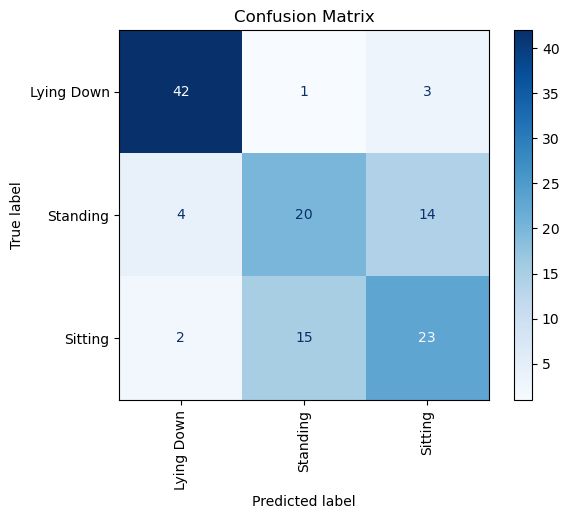

In [45]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

def tune_hyperparameters_grid(X_train, y_train, X_test, y_test):
    print("Starting Grid Search for Hyperparameter Tuning...")

    # Define the hyperparameter grid
    param_grid = {
        'n_estimators': [50, 100, 200],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'max_features': ['sqrt', 'log2']
    }

    # Initialize the Random Forest Classifier
    rf = RandomForestClassifier(random_state=42)

    # Initialize Grid Search with cross-validation
    grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, 
                               scoring='accuracy', cv=5, n_jobs=-1, verbose=2)

    # Fit Grid Search on the training data
    print("Fitting Grid Search...")
    grid_search.fit(X_train, y_train)
    print("Grid Search completed!")

    # Get the best hyperparameters and model
    best_params = grid_search.best_params_
    best_rf = grid_search.best_estimator_

    # Print the best hyperparameters and training accuracy
    print(f"\nBest Hyperparameters (Grid Search): {best_params}")
    print(f"Best Training Accuracy: {grid_search.best_score_:.2f}")

    # Step 1: Make predictions on the test set
    y_pred = best_rf.predict(X_test)

    # Step 2: Print the classification report
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred, target_names=y_test.unique()))

    # Step 3: Compute and display the confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=y_test.unique())
    
    # Plot the confusion matrix
    disp.plot(cmap='Blues', xticks_rotation='vertical')
    plt.title("Confusion Matrix")
    plt.show()

    return best_rf

# Example usage
best_rf = tune_hyperparameters_grid(X_train, y_train, X_test, y_test)



Starting Grid Search for Hyperparameter Tuning...
Fitting Grid Search...
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Grid Search completed!

Best Hyperparameters (Grid Search): {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 50}
Best Training Accuracy: 0.79

Classification Report:
              precision    recall  f1-score   support

  Lying Down       0.88      0.91      0.89        46
    Standing       0.56      0.53      0.54        38
     Sitting       0.57      0.57      0.57        40

    accuracy                           0.69       124
   macro avg       0.67      0.67      0.67       124
weighted avg       0.68      0.69      0.68       124



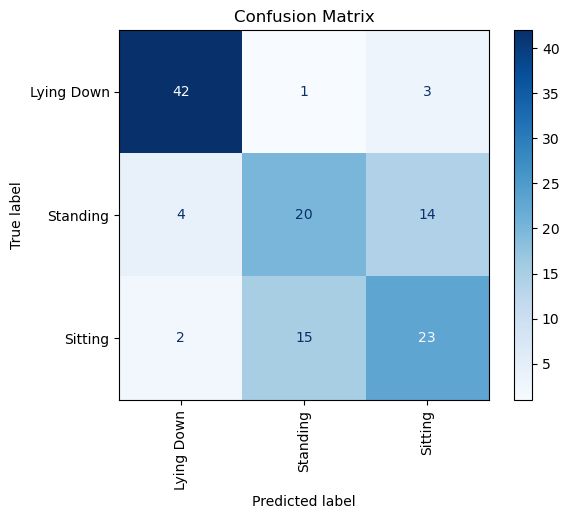

Predicted Pose: Sitting


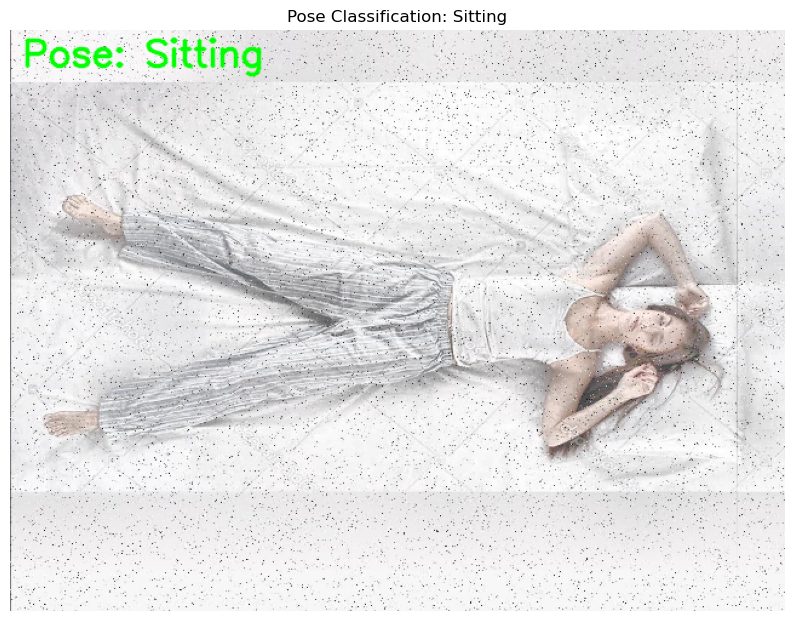

In [49]:

def classify_image(image_path, model):
    # Load the image
    img = cv.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return

    # Resize the image to a fixed size (optional)
    img = cv.resize(img, (640, 480))

    # Extract keypoints and draw the skeleton
    keypoints = pose_estimation_with_skeleton(img, thr=0.2)

    # Convert keypoints to a feature vector
    feature_vector = []
    for point in keypoints:
        if point is not None:
            feature_vector.extend([point[0], point[1]])
        else:
            feature_vector.extend([0, 0])

    # Ensure the feature vector has the correct length
    if len(feature_vector) == len(BODY_PARTS) * 2:
        # Convert feature_vector to a DataFrame with the same column names used in training
        feature_vector_df = pd.DataFrame([feature_vector], columns=X_train.columns)

        # Predict using the provided model
        prediction = model.predict(feature_vector_df)[0]
        print(f"Predicted Pose: {prediction}")

        # Display the image with the skeleton and prediction
        cv.putText(img, f"Pose: {prediction}", (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv.LINE_AA)

        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.title(f"Pose Classification: {prediction}")
        plt.axis('off')
        plt.show()
    else:
        print("Error: Incomplete keypoint extraction. Unable to classify pose.")

best_rf = tune_hyperparameters_grid(X_train, y_train, X_test, y_test)

# Example usage
image_path = "Desktop/Fall Detection/Lying Down/57_jpg.rf.852af7a7db5efce5a701bf2e7d2f75d4.jpg"
classify_image(image_path, best_rf)

Starting Grid Search for Hyperparameter Tuning...
Fitting Grid Search...
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Grid Search completed!

Best Hyperparameters (Grid Search): {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 50}
Best Training Accuracy: 0.79

Classification Report:
              precision    recall  f1-score   support

  Lying Down       0.88      0.91      0.89        46
    Standing       0.56      0.53      0.54        38
     Sitting       0.57      0.57      0.57        40

    accuracy                           0.69       124
   macro avg       0.67      0.67      0.67       124
weighted avg       0.68      0.69      0.68       124



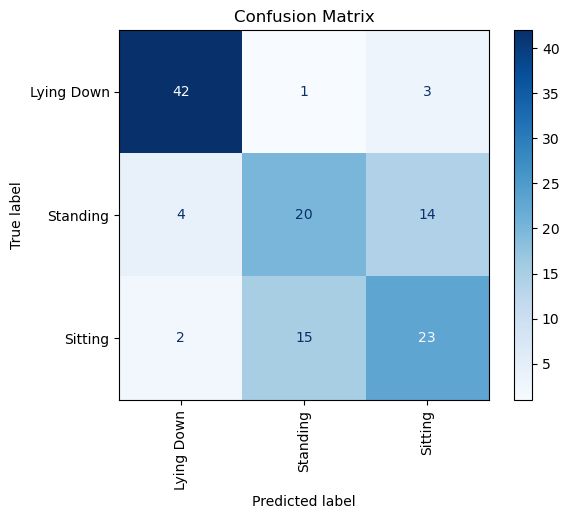

Predicted Pose: Sitting


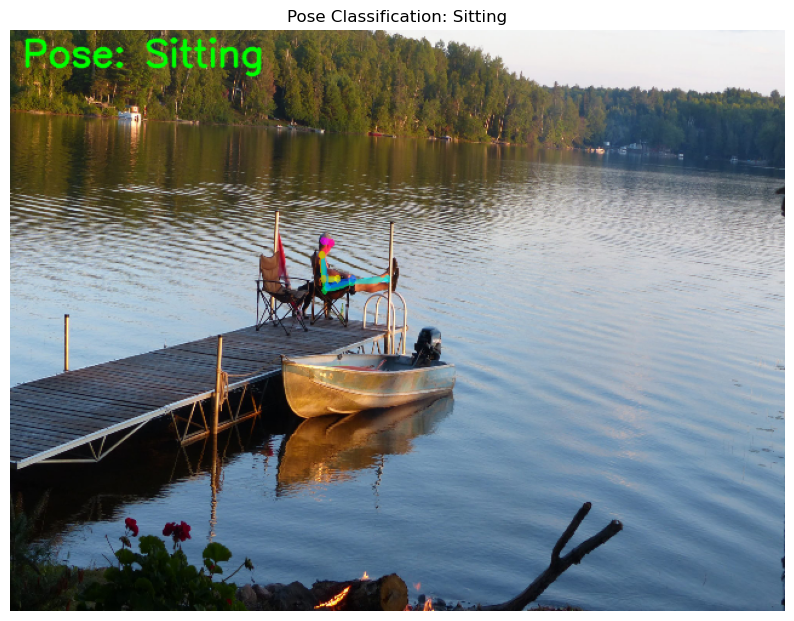

In [53]:

def classify_image(image_path, model):
    # Load the image
    img = cv.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return

    # Resize the image to a fixed size (optional)
    img = cv.resize(img, (640, 480))

    # Extract keypoints and draw the skeleton
    keypoints = pose_estimation_with_skeleton(img, thr=0.2)

    # Convert keypoints to a feature vector
    feature_vector = []
    for point in keypoints:
        if point is not None:
            feature_vector.extend([point[0], point[1]])
        else:
            feature_vector.extend([0, 0])

    # Ensure the feature vector has the correct length
    if len(feature_vector) == len(BODY_PARTS) * 2:
        # Convert feature_vector to a DataFrame with the same column names used in training
        feature_vector_df = pd.DataFrame([feature_vector], columns=X_train.columns)

        # Predict using the provided model
        prediction = model.predict(feature_vector_df)[0]
        print(f"Predicted Pose: {prediction}")

        # Display the image with the skeleton and prediction
        cv.putText(img, f"Pose: {prediction}", (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv.LINE_AA)

        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.title(f"Pose Classification: {prediction}")
        plt.axis('off')
        plt.show()
    else:
        print("Error: Incomplete keypoint extraction. Unable to classify pose.")

best_rf = tune_hyperparameters_grid(X_train, y_train, X_test, y_test)
# Example usage
image_path = "Desktop/Fall Detection/Sitting/sit_0000095_r_.png"
classify_image(image_path, best_rf)

Starting Grid Search for Hyperparameter Tuning...
Fitting Grid Search...
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Grid Search completed!

Best Hyperparameters (Grid Search): {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 50}
Best Training Accuracy: 0.79

Classification Report:
              precision    recall  f1-score   support

  Lying Down       0.88      0.91      0.89        46
    Standing       0.56      0.53      0.54        38
     Sitting       0.57      0.57      0.57        40

    accuracy                           0.69       124
   macro avg       0.67      0.67      0.67       124
weighted avg       0.68      0.69      0.68       124



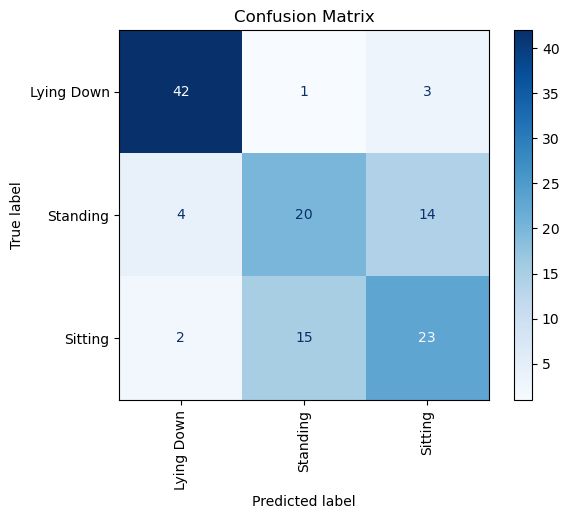

Predicted Pose: Standing


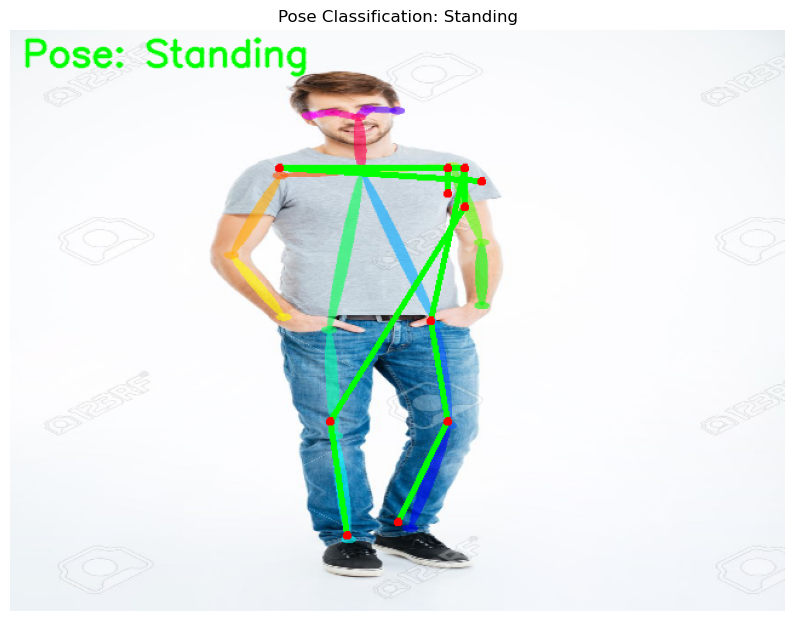

In [55]:

def classify_image(image_path, model):
    # Load the image
    img = cv.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return

    # Resize the image to a fixed size (optional)
    img = cv.resize(img, (640, 480))

    # Extract keypoints and draw the skeleton
    keypoints = pose_estimation_with_skeleton(img, thr=0.2)

    # Convert keypoints to a feature vector
    feature_vector = []
    for point in keypoints:
        if point is not None:
            feature_vector.extend([point[0], point[1]])
        else:
            feature_vector.extend([0, 0])

    # Ensure the feature vector has the correct length
    if len(feature_vector) == len(BODY_PARTS) * 2:
        # Convert feature_vector to a DataFrame with the same column names used in training
        feature_vector_df = pd.DataFrame([feature_vector], columns=X_train.columns)

        # Predict using the provided model
        prediction = model.predict(feature_vector_df)[0]
        print(f"Predicted Pose: {prediction}")

        # Display the image with the skeleton and prediction
        cv.putText(img, f"Pose: {prediction}", (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv.LINE_AA)

        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.title(f"Pose Classification: {prediction}")
        plt.axis('off')
        plt.show()
    else:
        print("Error: Incomplete keypoint extraction. Unable to classify pose.")

best_rf = tune_hyperparameters_grid(X_train, y_train, X_test, y_test)

# Example usage
image_path = "Desktop/Fall Detection/Standing/stand_0000009_r_.png"
classify_image(image_path, best_rf)

# **Live Camera Feed**

In [98]:
import cv2 as cv
import numpy as np

# Load the pre-trained Random Forest model from previous code
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)  # Fit the model again for the demo purpose

def predict_pose(frame):
    # Step 1: Extract keypoints using OpenPose
    keypoints = pose_estimation(frame, thr=0.2)
    
    # Convert keypoints to a flat feature vector (required for Random Forest)
    feature_vector = []
    for point in keypoints:
        if point is not None:
            feature_vector.extend([point[0], point[1]])
        else:
            feature_vector.extend([0, 0])  # Use 0 if keypoint is not detected

    # Step 2: Use Random Forest to predict the pose
    if len(feature_vector) == len(BODY_PARTS) * 2:
        # Ensure the feature vector has the correct length
        feature_vector = np.array(feature_vector).reshape(1, -1)
        prediction = rf_classifier.predict(feature_vector)[0]
    else:
        prediction = "Unknown"

    return prediction

# Initialize webcam
cap = cv.VideoCapture(0)

if not cap.isOpened():
    print("Error: Could not open webcam.")
    exit()

# Real-time loop
while True:
    ret, frame = cap.read()
    if not ret:
        break

    # Resize the frame for faster processing
    frame = cv.resize(frame, (640, 480))

    # Predict the pose
    pose_label = predict_pose(frame)

    # Display the prediction on the frame
    cv.putText(frame, f"Pose: {pose_label}", (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv.LINE_AA)

    # Show the frame with prediction
    cv.imshow("Real-Time Pose Classification", frame)

    # Press 'q' to quit the webcam stream
    if cv.waitKey(1) & 0xFF == ord('q'):
        print("Quitting webcam feed.")
        break

# Release the webcam and close windows
cap.release()
cv.destroyAllWindows()


C:\Users\61431\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\61431\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\61431\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\61431\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\61431\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\Users\61431\anaconda3\Lib\site-packages\sklearn\base.py:4

Quitting webcam feed.


# **Forward Neural Network**

In [59]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# Define the neural network model
def build_fnn_model(input_dim):
    model = keras.Sequential([
        layers.Input(shape=(input_dim,)),        # Updated line
        layers.Dense(128, activation='relu'),   # First hidden layer
        layers.Dense(64, activation='relu'),    # Second hidden layer
        layers.Dense(32, activation='relu'),    # Third hidden layer
        layers.Dense(len(y_train.unique()), activation='softmax')  # Output layer
    ])
    # Compile the model
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# Initialize the model
input_dim = X_train_scaled.shape[1]
fnn_model = build_fnn_model(input_dim)

# Print the model summary
fnn_model.summary()



Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4 (Dense)                 │ (None, 128)            │         4,992 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,427 (60.26 KB)

 Trainable params: 15,427 (60.26 KB)

 Non-trainable params: 0 (0.00 B)

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

Classification Report:
              precision    recall  f1-score   support

    Standing       0.00      0.00      0.00        46
     Sitting       0.50      0.03      0.05        38
  Lying Down       0.32      0.95      0.48        40

    accuracy                           0.31       124
   macro avg       0.27      0.33      0.18       124
weighted avg       0.26      0.31      0.17       124



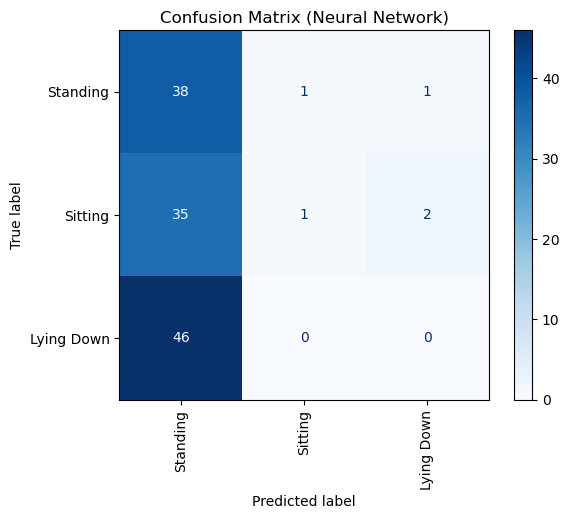

In [69]:
# Make predictions on the test set
y_pred = np.argmax(fnn_model.predict(X_test_scaled), axis=1)

# Convert y_pred to string labels to match y_test
y_pred_str = pd.Series(y_pred).map(dict(enumerate(y_train.unique())))

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_str, target_names=y_train.unique()))

# Compute and display the confusion matrix
cm = confusion_matrix(y_test, y_pred_str, labels=y_train.unique())
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=y_train.unique())

# Plot the confusion matrix
disp.plot(cmap='Blues', xticks_rotation='vertical')
plt.title("Confusion Matrix (Neural Network)")
plt.show()

Epoch 1/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - accuracy: 0.3150 - loss: 1.0979 - val_accuracy: 0.3710 - val_loss: 1.0982
Epoch 2/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.3491 - loss: 1.0979 - val_accuracy: 0.3710 - val_loss: 1.0980
Epoch 3/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.3693 - loss: 1.0965 - val_accuracy: 0.3710 - val_loss: 1.0975
Epoch 4/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.3774 - loss: 1.0959 - val_accuracy: 0.3710 - val_loss: 1.0972
Epoch 5/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.3302 - loss: 1.0977 - val_accuracy: 0.3710 - val_loss: 1.0971
Epoch 6/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.3429 - loss: 1.0978 - val_accuracy: 0.3710 - val_loss: 1.0969
Epoch 7/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.3388 - loss: 1.0955 - val_accuracy: 0.3710 - val_loss: 1.0968
Epoch 8/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.3732 - loss: 1.0930 - val_accuracy: 0.3710 - val_loss

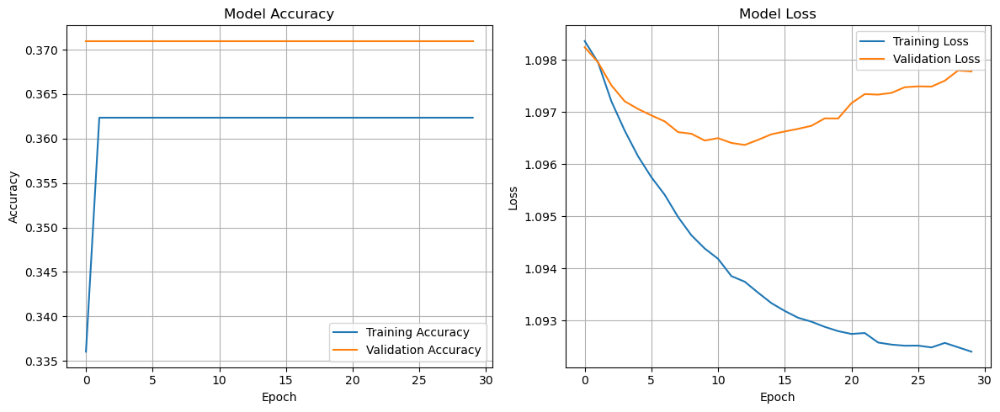

1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/stepWARNING:tensorflow:5 out of the last 21 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x0000011FC5522200> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Precision: 0.77, Recall: 0.37, F1-Score: 0.20


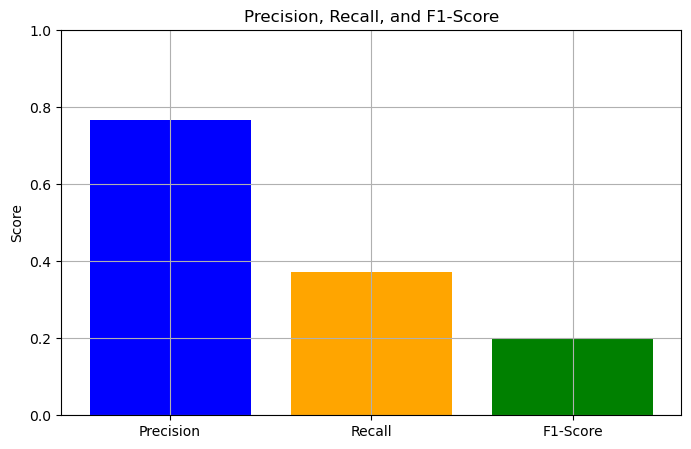

In [81]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import precision_score, recall_score, f1_score
from tensorflow import keras
from tensorflow.keras import layers


# Convert string labels to integer labels using LabelEncoder
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Standardize the feature values
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the Neural Network Model
def build_fnn_model(input_dim):
    model = keras.Sequential([
        layers.Input(shape=(input_dim,)),
        layers.Dense(128, activation='relu'),
        layers.Dense(64, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(len(np.unique(y_train)), activation='softmax')
    ])
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# Initialize the model
input_dim = X_train_scaled.shape[1]
fnn_model = build_fnn_model(input_dim)

#Train the Model
history = fnn_model.fit(
    X_train_scaled, y_train,
    validation_data=(X_test_scaled, y_test),
    epochs=30,
    batch_size=32,
    verbose=1
)

#  Plot Learning Curves for Accuracy and Loss
def plot_learning_curves(history):
    # Plot training & validation accuracy
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='best')
    plt.grid(True)

    # Plot training & validation loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='best')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

plot_learning_curves(history)

# Calculate Precision, Recall, and F1-score with zero_division=1
y_pred = np.argmax(fnn_model.predict(X_test_scaled), axis=1)

precision = precision_score(y_test, y_pred, average='weighted', zero_division=1)
recall = recall_score(y_test, y_pred, average='weighted', zero_division=1)
f1 = f1_score(y_test, y_pred, average='weighted', zero_division=1)

print(f'Precision: {precision:.2f}, Recall: {recall:.2f}, F1-Score: {f1:.2f}')

# Plot Precision, Recall, and F1-Score
plt.figure(figsize=(8, 5))
metrics = ['Precision', 'Recall', 'F1-Score']
scores = [precision, recall, f1]

plt.bar(metrics, scores, color=['blue', 'orange', 'green'])
plt.ylim(0, 1)
plt.title('Precision, Recall, and F1-Score')
plt.ylabel('Score')
plt.grid(True)
plt.show()



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Predicted Pose: Lying Down


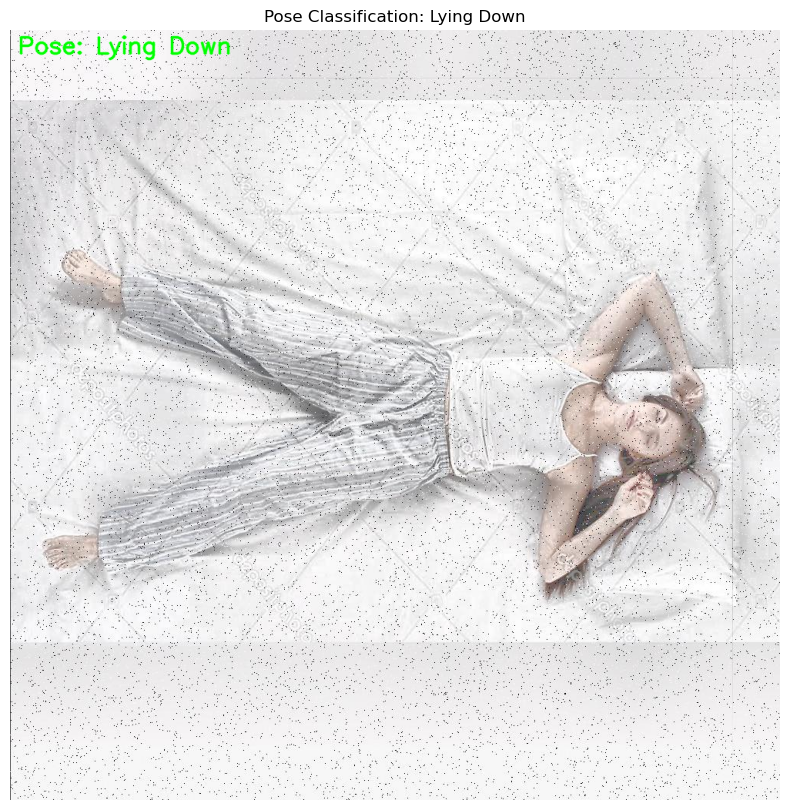

In [87]:

# Pre-process image
def preprocess_image(image_path):
    # Load the image
    img = cv.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return None

    # Resize the image to a fixed size (optional, depending on your feature extraction method)
    img = cv.resize(img, (640, 480))

    # Keypoint Threshold
    keypoints = pose_estimation_with_skeleton(img, thr=0.2)

    # Convert keypoints to a feature vector
    feature_vector = []
    for point in keypoints:
        if point is not None:
            feature_vector.extend([point[0], point[1]])
        else:
            feature_vector.extend([0, 0])

    # Ensure the feature vector has the correct length
    if len(feature_vector) != X_train.shape[1]:
        print("Error: Incomplete keypoint extraction. Unable to classify pose.")
        return None

    # Convert the feature vector to a DataFrame
    feature_vector_df = pd.DataFrame([feature_vector], columns=X_train.columns)

    # Standardize the feature vector
    feature_vector_scaled = scaler.transform(feature_vector_df)

    return feature_vector_scaled

def classify_uploaded_image(image_path, model, label_encoder):
    # Preprocess the image to get the feature vector
    feature_vector_scaled = preprocess_image(image_path)
    if feature_vector_scaled is None:
        return

    # Predict the class using the trained neural network model
    prediction = np.argmax(model.predict(feature_vector_scaled), axis=1)[0]

    # Map the prediction back to the original label
    predicted_label = label_encoder.inverse_transform([prediction])[0]
    print(f"Predicted Pose: {predicted_label}")

    # Display the image with prediction
    img = cv.imread(image_path)
    if img is not None:
        cv.putText(img, f"Pose: {predicted_label}", (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv.LINE_AA)
        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.title(f"Pose Classification: {predicted_label}")
        plt.axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {image_path}")

# Example usage
image_path = "Desktop/Fall Detection/Lying Down/57_jpg.rf.852af7a7db5efce5a701bf2e7d2f75d4.jpg"
classify_uploaded_image(image_path, fnn_model, label_encoder)



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Predicted Pose: Lying Down


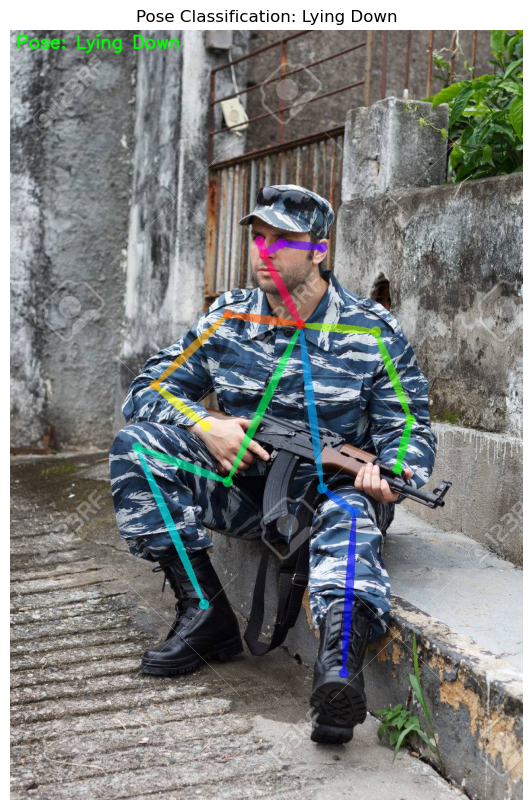

In [93]:
import pandas as pd
import cv2 as cv

def preprocess_image(image_path):
    # Load the image
    img = cv.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return None

    # Resize the image to a fixed size (optional, depending on your feature extraction method)
    img = cv.resize(img, (640, 480))

    # Example preprocessing: Assuming you have keypoint extraction
    keypoints = pose_estimation_with_skeleton(img, thr=0.2)

    # Convert keypoints to a feature vector
    feature_vector = []
    for point in keypoints:
        if point is not None:
            feature_vector.extend([point[0], point[1]])
        else:
            feature_vector.extend([0, 0])

    # Ensure the feature vector has the correct length
    if len(feature_vector) != X_train.shape[1]:
        print("Error: Incomplete keypoint extraction. Unable to classify pose.")
        return None

    # Convert the feature vector to a DataFrame
    feature_vector_df = pd.DataFrame([feature_vector], columns=X_train.columns)

    # Standardize the feature vector
    feature_vector_scaled = scaler.transform(feature_vector_df)

    return feature_vector_scaled

def classify_uploaded_image(image_path, model, label_encoder):
    # Preprocess the image to get the feature vector
    feature_vector_scaled = preprocess_image(image_path)
    if feature_vector_scaled is None:
        return

    # Predict the class using the trained neural network model
    prediction = np.argmax(model.predict(feature_vector_scaled), axis=1)[0]

    # Map the prediction back to the original label
    predicted_label = label_encoder.inverse_transform([prediction])[0]
    print(f"Predicted Pose: {predicted_label}")

    # Display the image with prediction
    img = cv.imread(image_path)
    if img is not None:
        cv.putText(img, f"Pose: {predicted_label}", (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv.LINE_AA)
        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.title(f"Pose Classification: {predicted_label}")
        plt.axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {image_path}")

# Example usage
image_path = "Desktop/Fall Detection/Sitting/sit_0000004_r_.png"
classify_uploaded_image(image_path, fnn_model, label_encoder)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Predicted Pose: Lying Down


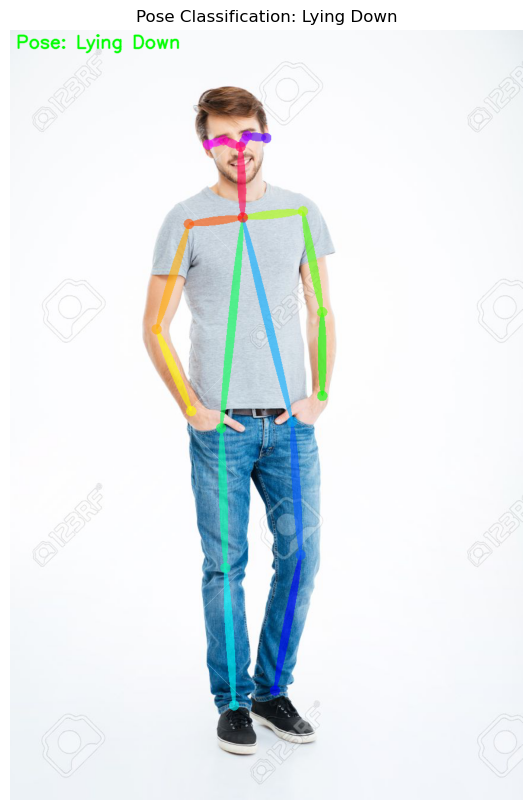

In [95]:
import pandas as pd
import cv2 as cv

def preprocess_image(image_path):
    # Load the image
    img = cv.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return None

    # Resize the image to a fixed size (optional, depending on your feature extraction method)
    img = cv.resize(img, (640, 480))

    # Example preprocessing: Assuming you have keypoint extraction
    keypoints = pose_estimation_with_skeleton(img, thr=0.2)

    # Convert keypoints to a feature vector
    feature_vector = []
    for point in keypoints:
        if point is not None:
            feature_vector.extend([point[0], point[1]])
        else:
            feature_vector.extend([0, 0])

    # Ensure the feature vector has the correct length
    if len(feature_vector) != X_train.shape[1]:
        print("Error: Incomplete keypoint extraction. Unable to classify pose.")
        return None

    # Convert the feature vector to a DataFrame
    feature_vector_df = pd.DataFrame([feature_vector], columns=X_train.columns)

    # Standardize the feature vector
    feature_vector_scaled = scaler.transform(feature_vector_df)

    return feature_vector_scaled

def classify_uploaded_image(image_path, model, label_encoder):
    # Preprocess the image to get the feature vector
    feature_vector_scaled = preprocess_image(image_path)
    if feature_vector_scaled is None:
        return

    # Predict the class using the trained neural network model
    prediction = np.argmax(model.predict(feature_vector_scaled), axis=1)[0]

    # Map the prediction back to the original label
    predicted_label = label_encoder.inverse_transform([prediction])[0]
    print(f"Predicted Pose: {predicted_label}")

    # Display the image with prediction
    img = cv.imread(image_path)
    if img is not None:
        cv.putText(img, f"Pose: {predicted_label}", (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv.LINE_AA)
        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.title(f"Pose Classification: {predicted_label}")
        plt.axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {image_path}")

# Example usage
image_path = "Desktop/Fall Detection/Standing/stand_0000009_r_.png" 
classify_uploaded_image(image_path, fnn_model, label_encoder)


# **Post Parameter Tuning**

Starting Grid Search...
Fitting 3 folds for each of 24 candidates, totalling 72 fits
Grid Search completed!

Best Hyperparameters (Grid Search): {'batch_size': 32, 'epochs': 30, 'model__dropout_rate': 0.2, 'model__optimizer': 'rmsprop'}
Best Training Accuracy: 0.72

Classification Report:
              precision    recall  f1-score   support

  Lying Down       0.80      0.93      0.86        46
     Sitting       0.56      0.47      0.51        38
    Standing       0.61      0.57      0.59        40

    accuracy                           0.68       124
   macro avg       0.65      0.66      0.65       124
weighted avg       0.66      0.68      0.67       124



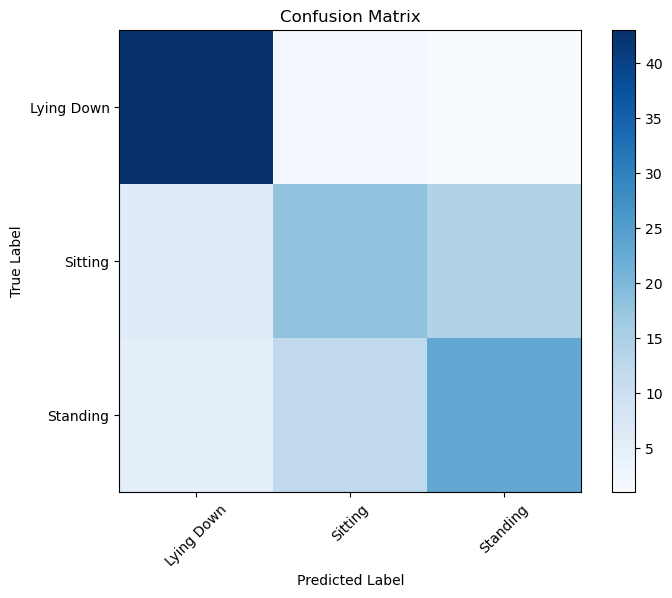

In [104]:
!pip install scikeras
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from scikeras.wrappers import KerasClassifier
from sklearn.impute import SimpleImputer



# Convert string labels to integer labels using LabelEncoder
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Handle NaN values in the features
imputer = SimpleImputer(strategy='mean')  # Use mean to impute missing values
X_imputed = imputer.fit_transform(X)

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_imputed, y_encoded, test_size=0.2, random_state=42)

# Standardize the feature values
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the Neural Network Model for KerasClassifier
def build_fnn_model(input_dim, optimizer='adam', dropout_rate=0.0):
    model = keras.Sequential([
        layers.Input(shape=(input_dim,)),
        layers.Dense(128, activation='relu'),
        layers.Dropout(dropout_rate),
        layers.Dense(64, activation='relu'),
        layers.Dropout(dropout_rate),
        layers.Dense(32, activation='relu'),
        layers.Dense(len(np.unique(y_train)), activation='softmax')
    ])
    model.compile(optimizer=optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# Wrap the model using KerasClassifier
fnn_clf = KerasClassifier(
    model=build_fnn_model,
    input_dim=X_train_scaled.shape[1],
    verbose=0
)

# Define the Hyperparameter Grid
param_grid = {
    'model__optimizer': ['adam', 'rmsprop'],
    'model__dropout_rate': [0.0, 0.2, 0.5],
    'epochs': [20, 30],
    'batch_size': [32, 64]
}

#Initialize Grid Search with Cross-Validation
grid_search = GridSearchCV(
    estimator=fnn_clf,
    param_grid=param_grid,
    scoring='accuracy',
    cv=3,
    n_jobs=-1,
    verbose=1
)

# Fit Grid Search on the training data
print("Starting Grid Search...")
grid_search.fit(X_train_scaled, y_train)
print("Grid Search completed!")

# Get the best hyperparameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

print(f"\nBest Hyperparameters (Grid Search): {best_params}")
print(f"Best Training Accuracy: {grid_search.best_score_:.2f}")

# Evaluate the Best Model
y_pred = best_model.predict(X_test_scaled)

# Convert y_pred back to original labels
y_pred_labels = label_encoder.inverse_transform(y_pred)
y_test_labels = label_encoder.inverse_transform(y_test)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test_labels, y_pred_labels))

# Compute and display the confusion matrix
cm = confusion_matrix(y_test_labels, y_pred_labels)
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap='Blues')
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(label_encoder.classes_))
plt.xticks(tick_marks, label_encoder.classes_, rotation=45)
plt.yticks(tick_marks, label_encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


Epoch 1/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.4735 - loss: 1.0500 - val_accuracy: 0.6532 - val_loss: 0.9392
Epoch 2/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6146 - loss: 0.9015 - val_accuracy: 0.6532 - val_loss: 0.8942
Epoch 3/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6743 - loss: 0.8713 - val_accuracy: 0.6694 - val_loss: 0.8497
Epoch 4/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6547 - loss: 0.7824 - val_accuracy: 0.6371 - val_loss: 0.8064
Epoch 5/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7105 - loss: 0.7169 - val_accuracy: 0.6371 - val_loss: 0.8292
Epoch 6/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.7392 - loss: 0.6506 - val_accuracy: 0.6129 - val_loss: 0.7986
Epoch 7/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7243 - loss: 0.6131 - val_accuracy: 0.6290 - val_loss: 0.7868
Epoch 8/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7526 - loss: 0.5918 - val_accuracy: 0.6371 - val_lo

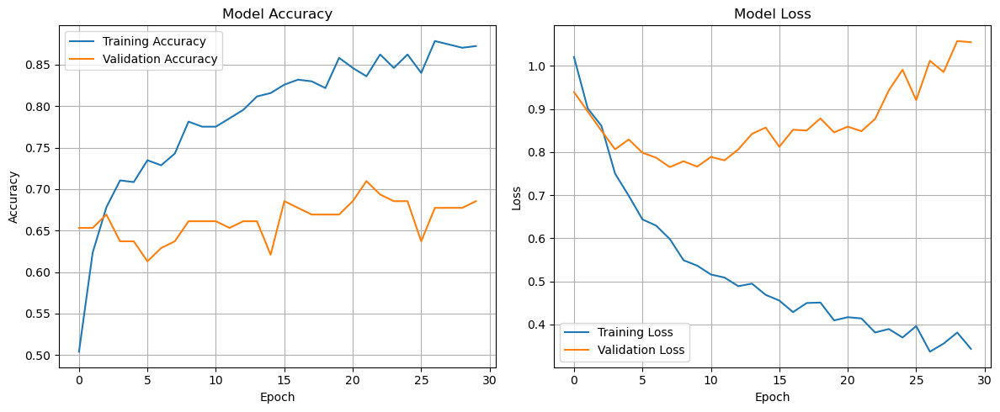

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
Precision: 0.77, Recall: 0.37, F1-Score: 0.20


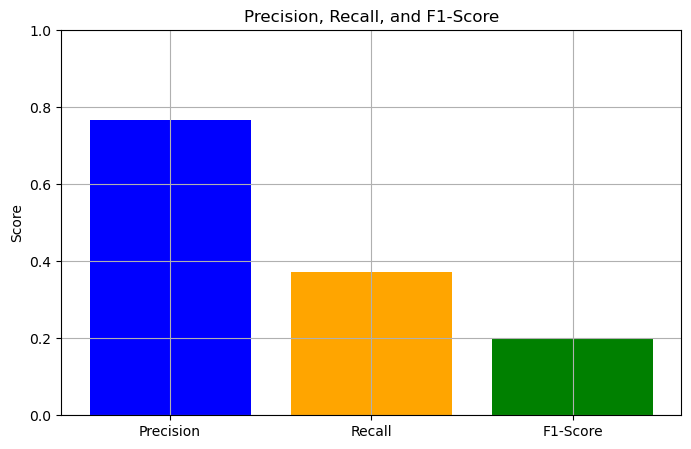

In [108]:
import matplotlib.pyplot as plt

# Step 1: Re-train the Best Model from Grid Search
best_fnn_model = build_fnn_model(
    input_dim=X_train_scaled.shape[1],
    optimizer=best_params['model__optimizer'],
    dropout_rate=best_params['model__dropout_rate']
)

# Fit the model with the best hyperparameters
history = best_fnn_model.fit(
    X_train_scaled, y_train,
    validation_data=(X_test_scaled, y_test),
    epochs=best_params['epochs'],
    batch_size=best_params['batch_size'],
    verbose=1
)

# Step 2: Plot Learning Curves for Accuracy and Loss
def plot_learning_curves(history):
    plt.figure(figsize=(12, 5))
    
    # Plot training & validation accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='best')
    plt.grid(True)

    # Plot training & validation loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='best')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Step 3: Call the function to plot learning curves
plot_learning_curves(history)


# Calculate Precision, Recall, and F1-score with zero_division=1
y_pred = np.argmax(fnn_model.predict(X_test_scaled), axis=1)

precision = precision_score(y_test, y_pred, average='weighted', zero_division=1)
recall = recall_score(y_test, y_pred, average='weighted', zero_division=1)
f1 = f1_score(y_test, y_pred, average='weighted', zero_division=1)

print(f'Precision: {precision:.2f}, Recall: {recall:.2f}, F1-Score: {f1:.2f}')

# Plot Precision, Recall, and F1-Score
plt.figure(figsize=(8, 5))
metrics = ['Precision', 'Recall', 'F1-Score']
scores = [precision, recall, f1]

plt.bar(metrics, scores, color=['blue', 'orange', 'green'])
plt.ylim(0, 1)
plt.title('Precision, Recall, and F1-Score')
plt.ylabel('Score')
plt.grid(True)
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
Predicted Pose: Lying Down


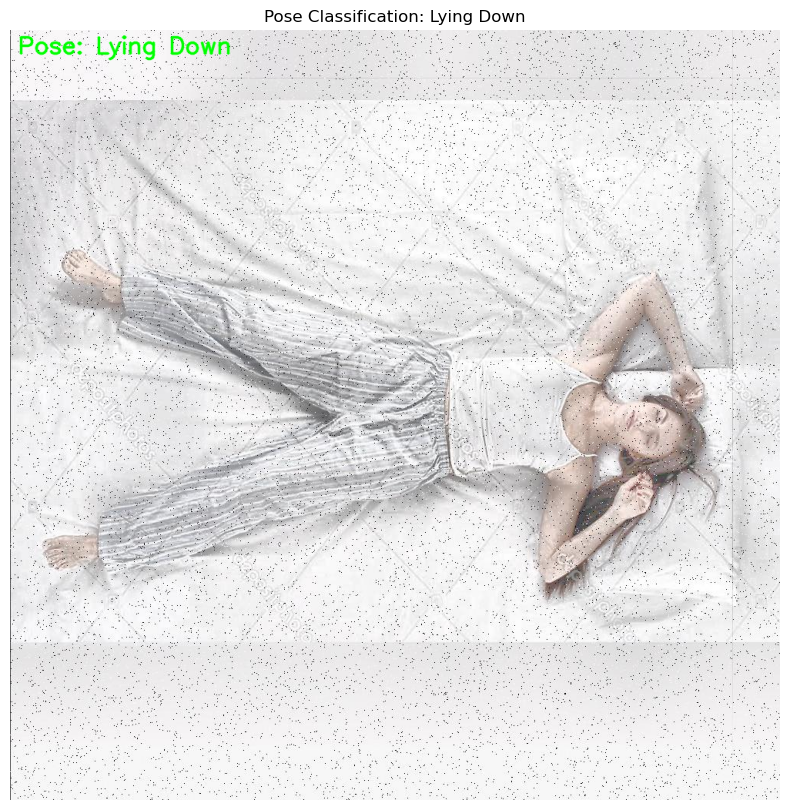

In [114]:
def preprocess_image(image_path):
    # Load the image
    img = cv.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return None

    # Resize the image to a fixed size (if necessary for feature extraction)
    img = cv.resize(img, (640, 480))

    # Extract keypoints using pose estimation (if applicable)
    keypoints = pose_estimation_with_skeleton(img, thr=0.2)

    # Convert keypoints to a feature vector
    feature_vector = []
    for point in keypoints:
        if point is not None:
            feature_vector.extend([point[0], point[1]])
        else:
            feature_vector.extend([0, 0])

    # Ensure the feature vector has the correct length
    if len(feature_vector) != X_train.shape[1]:
        print("Error: Incomplete keypoint extraction. Unable to classify pose.")
        return None

    # Convert to NumPy array and standardize
    feature_vector_scaled = scaler.transform([feature_vector])

    return feature_vector_scaled

def classify_uploaded_image(image_path, model, label_encoder):
    # Preprocess the image to get the feature vector
    feature_vector_scaled = preprocess_image(image_path)
    if feature_vector_scaled is None:
        return

    # Predict the class using the best neural network model
    prediction = np.argmax(model.predict(feature_vector_scaled), axis=1)[0]

    # Map the prediction back to the original label
    predicted_label = label_encoder.inverse_transform([prediction])[0]
    print(f"Predicted Pose: {predicted_label}")

    # Display the image with the prediction
    img = cv.imread(image_path)
    if img is not None:
        cv.putText(img, f"Pose: {predicted_label}", (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv.LINE_AA)
        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.title(f"Pose Classification: {predicted_label}")
        plt.axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {image_path}")

# Example usage
image_path = "Desktop/Fall Detection/Lying Down/57_jpg.rf.852af7a7db5efce5a701bf2e7d2f75d4.jpg"
classify_uploaded_image(image_path, best_fnn_model, label_encoder)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
Predicted Pose: Lying Down


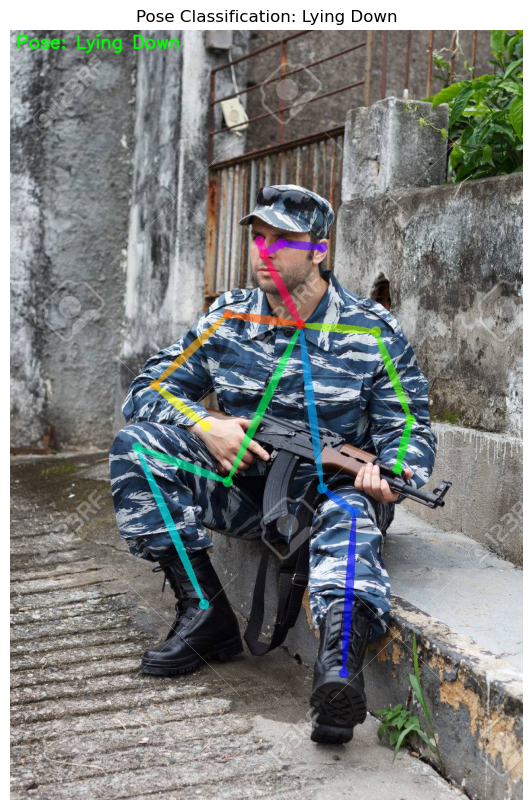

In [116]:
import cv2 as cv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def preprocess_image(image_path):
    # Load the image
    img = cv.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return None

    # Resize the image to a fixed size (if necessary for feature extraction)
    img = cv.resize(img, (640, 480))

    # Extract keypoints using pose estimation (if applicable)
    keypoints = pose_estimation_with_skeleton(img, thr=0.2)

    # Convert keypoints to a feature vector
    feature_vector = []
    for point in keypoints:
        if point is not None:
            feature_vector.extend([point[0], point[1]])
        else:
            feature_vector.extend([0, 0])

    # Ensure the feature vector has the correct length
    if len(feature_vector) != X_train.shape[1]:
        print("Error: Incomplete keypoint extraction. Unable to classify pose.")
        return None

    # Convert to NumPy array and standardize
    feature_vector_scaled = scaler.transform([feature_vector])

    return feature_vector_scaled

def classify_uploaded_image(image_path, model, label_encoder):
    # Preprocess the image to get the feature vector
    feature_vector_scaled = preprocess_image(image_path)
    if feature_vector_scaled is None:
        return

    # Predict the class using the best neural network model
    prediction = np.argmax(model.predict(feature_vector_scaled), axis=1)[0]

    # Map the prediction back to the original label
    predicted_label = label_encoder.inverse_transform([prediction])[0]
    print(f"Predicted Pose: {predicted_label}")

    # Display the image with the prediction
    img = cv.imread(image_path)
    if img is not None:
        cv.putText(img, f"Pose: {predicted_label}", (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv.LINE_AA)
        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.title(f"Pose Classification: {predicted_label}")
        plt.axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {image_path}")

# Example usage
image_path = "Desktop/Fall Detection/Sitting/sit_0000004_r_.png"
classify_uploaded_image(image_path, best_fnn_model, label_encoder)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
Predicted Pose: Lying Down


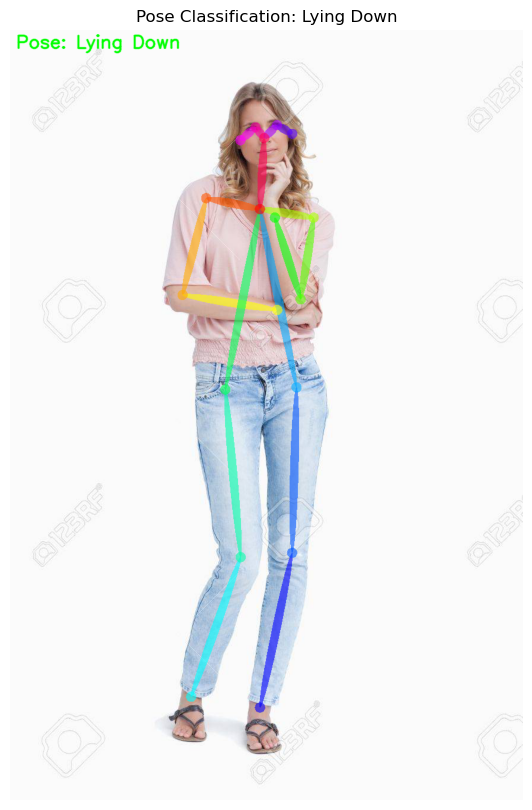

In [118]:
def preprocess_image(image_path):
    # Load the image
    img = cv.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return None

    # Resize the image to a fixed size (if necessary for feature extraction)
    img = cv.resize(img, (640, 480))

    # Extract keypoints using pose estimation (if applicable)
    keypoints = pose_estimation_with_skeleton(img, thr=0.2)

    # Convert keypoints to a feature vector
    feature_vector = []
    for point in keypoints:
        if point is not None:
            feature_vector.extend([point[0], point[1]])
        else:
            feature_vector.extend([0, 0])

    # Ensure the feature vector has the correct length
    if len(feature_vector) != X_train.shape[1]:
        print("Error: Incomplete keypoint extraction. Unable to classify pose.")
        return None

    # Convert to NumPy array and standardize
    feature_vector_scaled = scaler.transform([feature_vector])

    return feature_vector_scaled

def classify_uploaded_image(image_path, model, label_encoder):
    # Preprocess the image to get the feature vector
    feature_vector_scaled = preprocess_image(image_path)
    if feature_vector_scaled is None:
        return

    # Predict the class using the best neural network model
    prediction = np.argmax(model.predict(feature_vector_scaled), axis=1)[0]

    # Map the prediction back to the original label
    predicted_label = label_encoder.inverse_transform([prediction])[0]
    print(f"Predicted Pose: {predicted_label}")

    # Display the image with the prediction
    img = cv.imread(image_path)
    if img is not None:
        cv.putText(img, f"Pose: {predicted_label}", (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv.LINE_AA)
        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.title(f"Pose Classification: {predicted_label}")
        plt.axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {image_path}")

# Example usage
image_path = "Desktop/Fall Detection/Standing/stand_0000003_r_.png"
classify_uploaded_image(image_path, best_fnn_model, label_encoder)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Predicted Pose: Standing


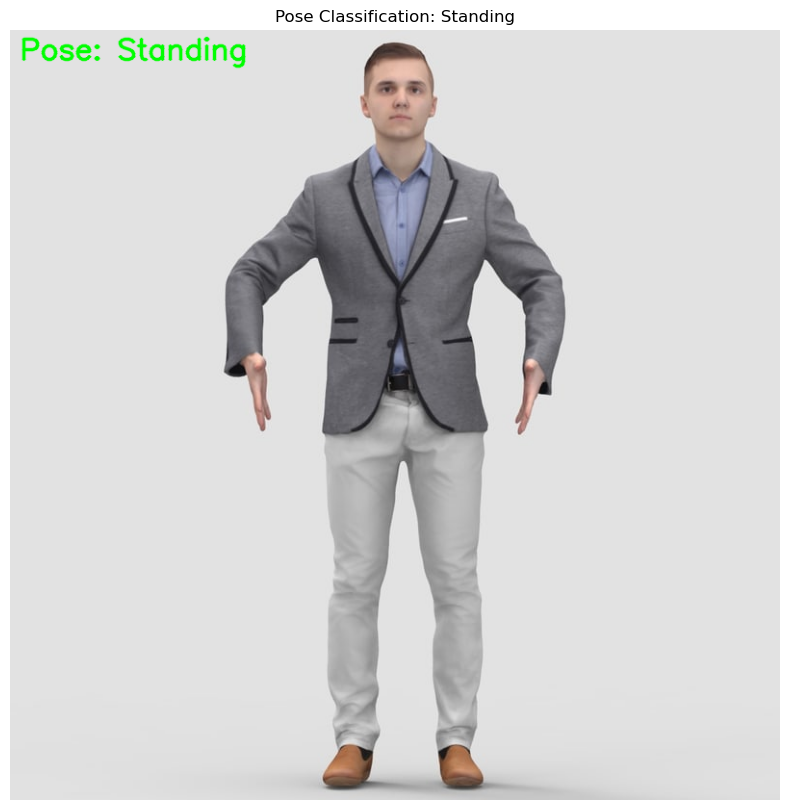

In [120]:
def preprocess_image(image_path):
    # Load the image
    img = cv.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return None

    # Resize the image to a fixed size (if necessary for feature extraction)
    img = cv.resize(img, (640, 480))

    # Extract keypoints using pose estimation (if applicable)
    keypoints = pose_estimation_with_skeleton(img, thr=0.2)

    # Convert keypoints to a feature vector
    feature_vector = []
    for point in keypoints:
        if point is not None:
            feature_vector.extend([point[0], point[1]])
        else:
            feature_vector.extend([0, 0])

    # Ensure the feature vector has the correct length
    if len(feature_vector) != X_train.shape[1]:
        print("Error: Incomplete keypoint extraction. Unable to classify pose.")
        return None

    # Convert to NumPy array and standardize
    feature_vector_scaled = scaler.transform([feature_vector])

    return feature_vector_scaled

def classify_uploaded_image(image_path, model, label_encoder):
    # Preprocess the image to get the feature vector
    feature_vector_scaled = preprocess_image(image_path)
    if feature_vector_scaled is None:
        return

    # Predict the class using the best neural network model
    prediction = np.argmax(model.predict(feature_vector_scaled), axis=1)[0]

    # Map the prediction back to the original label
    predicted_label = label_encoder.inverse_transform([prediction])[0]
    print(f"Predicted Pose: {predicted_label}")

    # Display the image with the prediction
    img = cv.imread(image_path)
    if img is not None:
        cv.putText(img, f"Pose: {predicted_label}", (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv.LINE_AA)
        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.title(f"Pose Classification: {predicted_label}")
        plt.axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {image_path}")

# Example usage
image_path = "Desktop/Fall/human-pose-estimation-opencv-master/image.jpg"
classify_uploaded_image(image_path, best_fnn_model, label_encoder)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Predicted Pose: Sitting


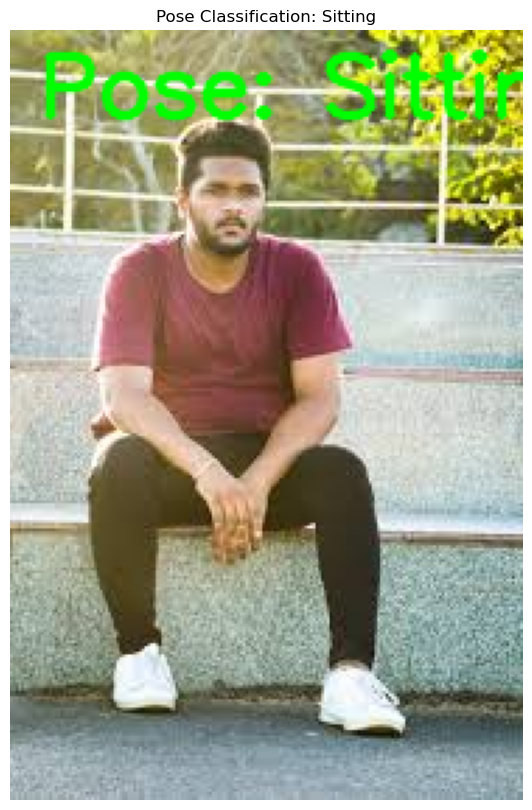

In [122]:
def preprocess_image(image_path):
    # Load the image
    img = cv.imread(image_path)
    if img is None:
        print(f"Error: Could not load image at {image_path}")
        return None

    # Resize the image to a fixed size (if necessary for feature extraction)
    img = cv.resize(img, (640, 480))

    # Extract keypoints using pose estimation (if applicable)
    keypoints = pose_estimation_with_skeleton(img, thr=0.2)

    # Convert keypoints to a feature vector
    feature_vector = []
    for point in keypoints:
        if point is not None:
            feature_vector.extend([point[0], point[1]])
        else:
            feature_vector.extend([0, 0])

    # Ensure the feature vector has the correct length
    if len(feature_vector) != X_train.shape[1]:
        print("Error: Incomplete keypoint extraction. Unable to classify pose.")
        return None

    # Convert to NumPy array and standardize
    feature_vector_scaled = scaler.transform([feature_vector])

    return feature_vector_scaled

def classify_uploaded_image(image_path, model, label_encoder):
    # Preprocess the image to get the feature vector
    feature_vector_scaled = preprocess_image(image_path)
    if feature_vector_scaled is None:
        return

    # Predict the class using the best neural network model
    prediction = np.argmax(model.predict(feature_vector_scaled), axis=1)[0]

    # Map the prediction back to the original label
    predicted_label = label_encoder.inverse_transform([prediction])[0]
    print(f"Predicted Pose: {predicted_label}")

    # Display the image with the prediction
    img = cv.imread(image_path)
    if img is not None:
        cv.putText(img, f"Pose: {predicted_label}", (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv.LINE_AA)
        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 10))
        plt.imshow(img_rgb)
        plt.title(f"Pose Classification: {predicted_label}")
        plt.axis('off')
        plt.show()
    else:
        print(f"Error: Could not load image at {image_path}")

# Example usage
image_path = "Downloads/sit.jpg"
classify_uploaded_image(image_path, best_fnn_model, label_encoder)


# **Live Webcam Feed**

In [127]:
import cv2 as cv
import numpy as np

def preprocess_frame_for_nn(frame):
    # Resize the frame
    frame_resized = cv.resize(frame, (640, 480))

    # Extract keypoints using pose estimation (if applicable)
    keypoints = pose_estimation_with_skeleton(frame_resized, thr=0.2)

    # Convert keypoints to a feature vector
    feature_vector = []
    for point in keypoints:
        if point is not None:
            feature_vector.extend([point[0], point[1]])
        else:
            feature_vector.extend([0, 0])

    # Ensure the feature vector matches the input dimension of the model
    if len(feature_vector) != X_train.shape[1]:
        return None

    # Standardize the feature vector
    feature_vector_scaled = scaler.transform([feature_vector])

    return feature_vector_scaled

def classify_live_feed_with_nn(model, label_encoder):
    # Initialize webcam
    cap = cv.VideoCapture(0)
    if not cap.isOpened():
        print("Error: Could not open webcam.")
        return

    print("Starting live feed. Press 'q' to quit.")

    while True:
        # Capture frame-by-frame
        ret, frame = cap.read()
        if not ret:
            print("Error: Failed to capture frame.")
            break

        # Preprocess the frame
        feature_vector_scaled = preprocess_frame_for_nn(frame)
        if feature_vector_scaled is not None:
            # Predict the class using the neural network model
            prediction = np.argmax(model.predict(feature_vector_scaled), axis=1)[0]
            predicted_label = label_encoder.inverse_transform([prediction])[0]

            # Display the prediction on the frame
            cv.putText(frame, f"Pose: {predicted_label}", (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv.LINE_AA)

        # Display the frame
        cv.imshow('Live Pose Classification with NN', frame)

        # Break the loop if 'q' is pressed
        if cv.waitKey(1) & 0xFF == ord('q'):
            print("Quitting live feed.")
            break

    # Release the webcam and close all OpenCV windows
    cap.release()
    cv.destroyAllWindows()

# Example usage
classify_live_feed_with_nn(best_fnn_model, label_encoder)


Starting live feed. Press 'q' to quit.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━